
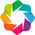

In [1]:
import holoviews as hv
hv.notebook_extension('bokeh')

In [2]:
from explorer.catalog import ParquetCatalog
import glob
from distributed import Client
client = Client()

files = glob.glob('data/forced_big_test*.parq')[:1]
catalog = ParquetCatalog(files, client=client)

In [3]:
from explorer.functors import (Mag, MagDiff, CustomFunctor, DeconvolvedMoments, Column,
                            SdssTraceSize, PsfSdssTraceSizeDiff, HsmTraceSize,
                            PsfHsmTraceSizeDiff, RAColumn, DecColumn, CompositeFunctor)

In [4]:
funcs = {'y1':MagDiff('modelfit_CModel', 'base_PsfFlux'),
          'y2':PsfHsmTraceSizeDiff(),
          'y3':PsfSdssTraceSizeDiff(),
        'y4':DeconvolvedMoments()}
funcs = list(funcs.values())

In [5]:
from explorer.plots import SkyPlot

sky = SkyPlot(catalog, funcs, group_labels=True)

In [6]:
%time sky.figure

CPU times: user 4.12 s, sys: 1.21 s, total: 5.33 s
Wall time: 12.6 s


:Layout
   .DynamicMap.Left_parenthesis_mag_modelfit_CModel_flux_hyphen_minus_mag_base_PsfFlux_flux_right_parenthesis :DynamicMap   [label]
   .DynamicMap.PSF_hyphen_minus_HSM_Trace_Size                                                                :DynamicMap   [label]
   .DynamicMap.PSF_hyphen_minus_SDSS_Trace_Size                                                               :DynamicMap   [label]
   .DynamicMap.Deconvolved_Moments                                                                            :DynamicMap   [label]

In [7]:
from explorer.plots import ScatterSkyPlot

scattersky = ScatterSkyPlot(catalog, funcs, linked=True)

In [8]:
%time scattersky.figure

CPU times: user 23.1 ms, sys: 4.11 ms, total: 27.2 ms
Wall time: 24.8 ms


:Layout
   .DynamicMap.I    :DynamicMap   []
   .DynamicMap.II   :DynamicMap   []
   .DynamicMap.III  :DynamicMap   []
   .DynamicMap.IV   :DynamicMap   []
   .DynamicMap.V    :DynamicMap   []
   .DynamicMap.VI   :DynamicMap   []
   .DynamicMap.VII  :DynamicMap   []
   .DynamicMap.VIII :DynamicMap   []

In [8]:
scattersky.set_query('dec < 1 and ra > 149')

In [9]:
scattersky.event(query='')

In [8]:
ds = scattersky.query_ds('label=="galaxy"')

In [9]:
len(ds)

1055579

In [9]:
scattersky.reset_bounds()

In [9]:
ds = scattersky.ds

In [16]:
ds.dimensions()

[Dimension('y0', label='(mag_modelfit_CModel_flux - mag_base_PsfFlux_flux)'),
 Dimension('y1', label='PSF - HSM Trace Size'),
 Dimension('y2', label='PSF - SDSS Trace Size'),
 Dimension('y3', label='Deconvolved Moments'),
 Dimension('ra', label='RA'),
 Dimension('dec', label='Dec'),
 Dimension('label'),
 Dimension('x', label='mag_base_PsfFlux_flux')]

In [17]:
df = ds.data.query('label=="star"')

In [18]:
ds2 = hv.Dataset(df, kdims=ds.dimensions())

In [20]:
len(ds2)

158893

In [21]:
len(ds)

1225882

In [11]:
scattersky._bounds_streams[2].event(bounds=(24,-150,30,-100))

/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:202: RuntimeWarning: invalid value encountered in greater_equal
  mask &= k.start <= arr
/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:204: RuntimeWarning: invalid value encountered in less
  mask &= arr < k.stop
/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:202: RuntimeWarning: invalid value encountered in greater_equal
  mask &= k.start <= arr
/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:204: RuntimeWarning: invalid value encountered in less
  mask &= arr < k.stop
/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:202: RuntimeWarning: invalid value encountered in greater_equal
  mask &= k.start <= arr
/Users/tdm/anaconda/envs/py3/lib/python3.6/site-packages/holoviews/core/data/interface.py:204: RuntimeWarning: invalid value en

In [ ]:
scattersky._bounds_streams

In [ ]:
len(scattersky.selected)

In [ ]:
scattersky.reset_bounds()

In [ ]:
dset = scattersky.ds.select(**{'x': (20, 25), 'y1': (-5, 5)})

In [ ]:
len(dset)

In [ ]:
from holoviews.operation.datashader import datashade

pts = dset.to(hv.Points, kdims=['x', 'y2'], vdims=['x'] + list(scattersky.funcs.keys()), groupby=[])
datashade(pts)

In [ ]:
scattersky._scatters[0].event

In [ ]:
hv.util.Dynamic?

In [ ]:
scattersky._bounds_streams

In [ ]:
print('\n'.join(['a','b','c']))

In [ ]:
b = scattersky._bounds_streams[0]

In [ ]:
hv.Text?

In [ ]:
b._subscribers

In [ ]:
DimName = hv.streams.Stream.define('DimName', ydim='y')

In [ ]:
dname = DimName(ydim='y')
dname2 = DimName(ydim='y2')

In [ ]:
print(dname)
print(dname2)

In [ ]:
ds = scattersky.ds

In [ ]:
ds

In [ ]:
from holoviews.operation.datashader import datashade, dynspread
from holoviews.operation import decimate
decimate.max_samples=5000
dynspread.max_px = 10
import datashader
import colorcet as cc

dset = scattersky.ds

def make_sky(ra_range, dec_range, bounds=None, **kwargs):
    if bounds is not None:
        x_range = bounds[0::2]
        y_range = bounds[1::2]
        dset = ds.select(x=x_range, y=y_range)
    else:
        dset = ds
        
    pts = dset.to(hv.Points, kdims=['ra', 'dec'], vdims=['x','y'], groupby=[])
    shaded = dynspread(datashade(pts, x_range=ra_range, y_range=dec_range, dynamic=False, 
                                     cmap=cc.palette['coolwarm'], aggregator=datashader.mean('y')))
    shaded = shaded.opts('RGB [width=300, height=300]')
    return shaded

def make_scatter(x_range, y_range, bounds, **kwargs):
    
    pts = ds.to(hv.Points, kdims=['x', 'y'], groupby=[])
    shaded = dynspread(datashade(pts, x_range=x_range, y_range=y_range, dynamic=False))
    shaded = shaded.opts('RGB [width=700, height=300]')

    if bounds is None:
        bounds = (0,0,0,0)
        
    box = hv.Bounds(bounds)
        
    return shaded * box

range_xy = hv.streams.RangeXY()
range_sky = hv.streams.RangeXY().rename(x_range='ra_range', y_range='dec_range')
bounds_xy = hv.streams.BoundsXY()

scatter = hv.DynamicMap(make_scatter, kdims=[], streams=[bounds_xy, range_xy])
sky = hv.DynamicMap(make_sky, kdims=[], streams=[bounds_xy, range_xy, range_sky])

scatter + sky